In [1]:
import numpy as np
import tensorflow as tf
import pandas as pd
from tqdm import tqdm
import os
# import cv2
from glob import glob
%matplotlib inline
import matplotlib.pyplot as plt
from tqdm import tqdm

In [2]:
#load data
os.listdir('C:/Users/hp/Desktop/ML/final_project/sample-data/data')

['Normal', 'Tuberculosis']

In [3]:
# !pip install tqdm

In [4]:
len(os.listdir('C:/Users/hp/Desktop/ML/final_project/sample-data/data/Tuberculosis'))

3500

In [5]:
len(os.listdir('C:/Users/hp/Desktop/ML/final_project/sample-data/data/Normal'))

3500

In [6]:
dir_path = 'C:/Users/hp/Desktop/ML/final_project/sample-data/data'
os.listdir(dir_path)

['Normal', 'Tuberculosis']

Subset: Normal
Index: 1
File name: Normal-1.png
Mode: RGB
Size: (512, 512)
Subset: Normal
Index: 2
File name: Normal-2.png
Mode: RGB
Size: (512, 512)
Subset: Normal
Index: 3
File name: Normal-3.png
Mode: RGB
Size: (512, 512)
Subset: Normal
Index: 4
File name: Normal-4.png
Mode: RGB
Size: (512, 512)
Subset: Tuberculosis
Index: 1
File name: Tuberculosis-1.png
Mode: L
Size: (512, 512)
Subset: Tuberculosis
Index: 2
File name: Tuberculosis-2.png
Mode: L
Size: (512, 512)
Subset: Tuberculosis
Index: 3
File name: Tuberculosis-3.png
Mode: L
Size: (512, 512)
Subset: Tuberculosis
Index: 4
File name: Tuberculosis-4.png
Mode: L
Size: (512, 512)


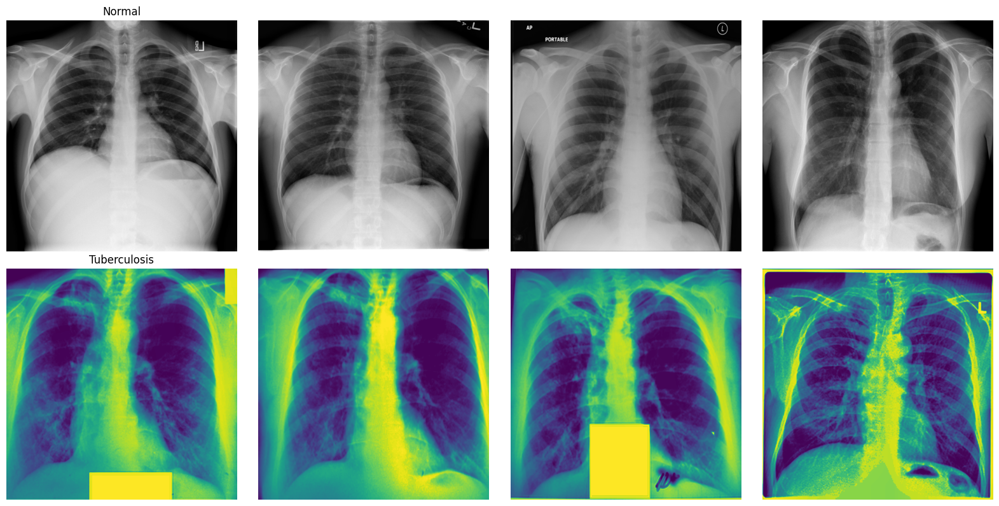

In [7]:
import re
from PIL import Image
# Create a figure with subplots
fig, axs = plt.subplots(2, 4, figsize=(16, 8))

# Set up the titles for the columns
axs[0, 0].set_title('Normal')
axs[1, 0].set_title('Tuberculosis')

# Function to display images in columns
def display_images(subset, row_index):
    subset_path = os.path.join(dir_path, subset)
    try:
        image_files = os.listdir(subset_path)
    except FileNotFoundError:
        print(f"Directory not found: {subset_path}")
        return

    # Filter and sort image files that match the expected pattern
    pattern = re.compile(rf'^{subset}-(\d+)\.png$')
    filtered_files = [f for f in image_files if pattern.match(f)]
    filtered_files.sort(key=lambda x: int(pattern.match(x).group(1)))

    # Display the first 4 images (or fewer if there are not enough images)
    col_index = 0
    for image_file in filtered_files[:4]:
        try:
            image_path = os.path.join(subset_path, image_file)
            image = Image.open(image_path)
            print(f"Subset: {subset}")
            print(f"Index: {col_index + 1}")
            print(f"File name: {image_file}")
            print(f"Mode: {image.mode}")
            print(f"Size: {image.size}")

            # Display the image in the appropriate subplot
            axs[row_index, col_index].imshow(image)
            axs[row_index, col_index].axis('off')  # Hide axes for better visibility
            col_index += 1
        except Exception as e:
            print(f"Error opening image {image_path}: {e}")

# Display images in the first row for 'Normal' and in the second row for 'Tuberculosis'
display_images('Normal', 0)
display_images('Tuberculosis', 1)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [8]:
# normal_df = Image_info_checker(subset='Normal', dir_path=dir_path)

In [9]:
# tb_df = Image_info_checker(subset='Tuberculosis', dir_path=dir_path)

data preprocessing

1.1 Data Transforming¶
1.1.1 Image Conversion

Problem: The dataset (Raw data) consists of .png files, making manipulation difficult.

Objective: Convert Image.PNG files to NumPy Arrays for easier manipulation, optimize and faster.

    Pros:
        Memory Efficiency: NumPy arrays require less memory than raw image files, making them ideal for large datasets.
        Computational Efficiency: NumPy array operations are optimized and faster.
    Cons:
        Lossy Compression: Converting images to NumPy arrays may reducing image quality.
        Storage and Disk Space: NumPy arrays can still consume significant disk space


In [10]:
from numpy import asarray
from tqdm import tqdm

In [11]:
def numpize(subset: str, label: int, img_size=(128, 128), grayscale=False):
    """
    Convert a set of images from a specified subset to NumPy arrays.

    Parameters:
    - subset (str): Specifies the subset of images, e.g., 'Normal' or 'Tuberculosis'.
    - label (int): Represents the label or class associated with the subset of images.
        - 'Normal' represented as 0,
        - 'Tuberculosis' represented as 1
    - img_size (tuple): Tuple representing the desired size of the images after resizing.
    - grayscale (bool): If True, convert images to grayscale.

    Returns:
    - numpy_array (numpy.ndarray): NumPy array containing the transformed images.
    """
    image_dir = f'{dir_path}/{subset}/'
    all_image_files = os.listdir(image_dir)

    # Filter and sort files that match the expected pattern
    pattern = re.compile(rf'^{subset}-(\d+)\.png$')
    filtered_files = [f for f in all_image_files if pattern.match(f)]
    filtered_files.sort(key=lambda x: int(pattern.match(x).group(1)))

    # Limit to the first 3500 files
    limited_files = filtered_files[:3500]

    transformed_images = []
    labels = []

    for image_file in tqdm(limited_files, desc='Transforming...'):
        image_path = os.path.join(image_dir, image_file)
        try:
            image = Image.open(image_path)

            # Ensure all images are in the same format
            if grayscale:
                image = image.convert('L')  # Convert to grayscale
            else:
                image = image.convert('RGB')  # Convert to RGB

            # Resize all images to the specified size without padding
            resized_image = image.resize(img_size)
            data = np.asarray(resized_image)

            # Append to list
            transformed_images.append(data)
            labels.append(label)
        except Exception as e:
            print(f"Error processing file {image_file}: {e}")

    images_numpy_array = np.array(transformed_images)
    labels_numpy_array = np.array(labels)
    return images_numpy_array, labels_numpy_array

normal

In [12]:
x_norm, y_norm = numpize(subset='Normal',
               label = 0,
               img_size=(128, 128),
               grayscale=False)
x_norm.shape

Transforming...: 100%|████████████████████████████████████████████████████████████| 3500/3500 [00:32<00:00, 106.31it/s]


(3500, 128, 128, 3)

tuberculosis

In [13]:
x_tb, y_tb = numpize(subset='Tuberculosis',
             label = 1,
             img_size=(128, 128),
             grayscale=False)
x_tb.shape

Transforming...: 100%|████████████████████████████████████████████████████████████| 3500/3500 [00:30<00:00, 113.72it/s]


(3500, 128, 128, 3)

In [14]:

def show_image(images, target, title, num_display=16, num_cols=4, cmap='gray', random_mode=False):
    '''
    :Parameters
        images (ndarray (n,)): Input data as a numpy array.
        target (ndarray (n,)): Target data as a numpy array.
        title (String): Title of the plot.
        num_display (int): Number of images to display. Default is 16.
        num_cols (int): Number of columns in the plot. Default is 4.
        cmap (str): Color map for displaying images. Default is 'gray'.
        random_mode (bool): If True, display images randomly. If False, display the first num_display images. Default is False.
    '''
    # Determine the number of rows based on the num_cols parameter
    n_cols = min(num_cols, num_display)
    n_rows = int(np.ceil(num_display / n_cols))

    n_images = min(num_display, len(images))
    if random_mode:
        if num_display > n_images:
            print("Warning: num_display exceeds the number of available images. Setting num_display to the number of available images.")
            num_display = n_images
        random_indices = np.random.choice(
            n_images, num_display, replace=False)
    else:
        num_display = min(num_display, n_images)
        random_indices = np.arange(num_display)

    fig, axes = plt.subplots(
        nrows=n_rows, ncols=n_cols, figsize=(17, 4*n_rows))
    for i, ax in enumerate(axes.flatten()):
        index = random_indices[i]
        if i >= n_images:  # Check if the index exceeds the available number of images
            break
        else:
            image = images[index]

        ax.imshow(image, cmap=cmap)
        ax.set_title("Target: {}".format(target[index]))

        # Add image index as text
        ax.text(0.5, -0.2, f'Image Index: {index}', transform=ax.transAxes,
                fontsize=7, ha='center')

    plt.suptitle(f"{title} (Displaying {num_display} Images)",
                 fontsize=16, fontweight='bold')

    fig.set_facecolor('white')
    plt.tight_layout()
    return plt.show()

normal

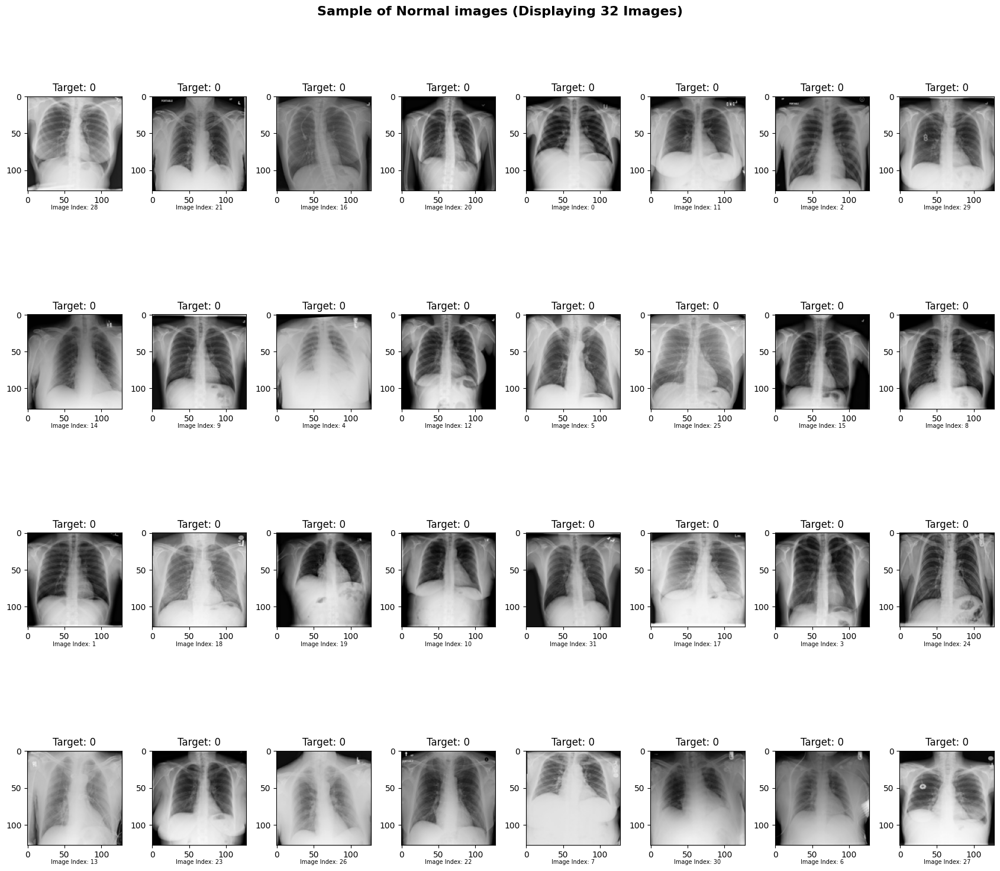

In [15]:
show_image(images=x_norm,
           target=y_norm,
           title='Sample of Normal images',
           num_display=32,
           num_cols=8,
           cmap='gray',
           random_mode=True)

tuberculosis

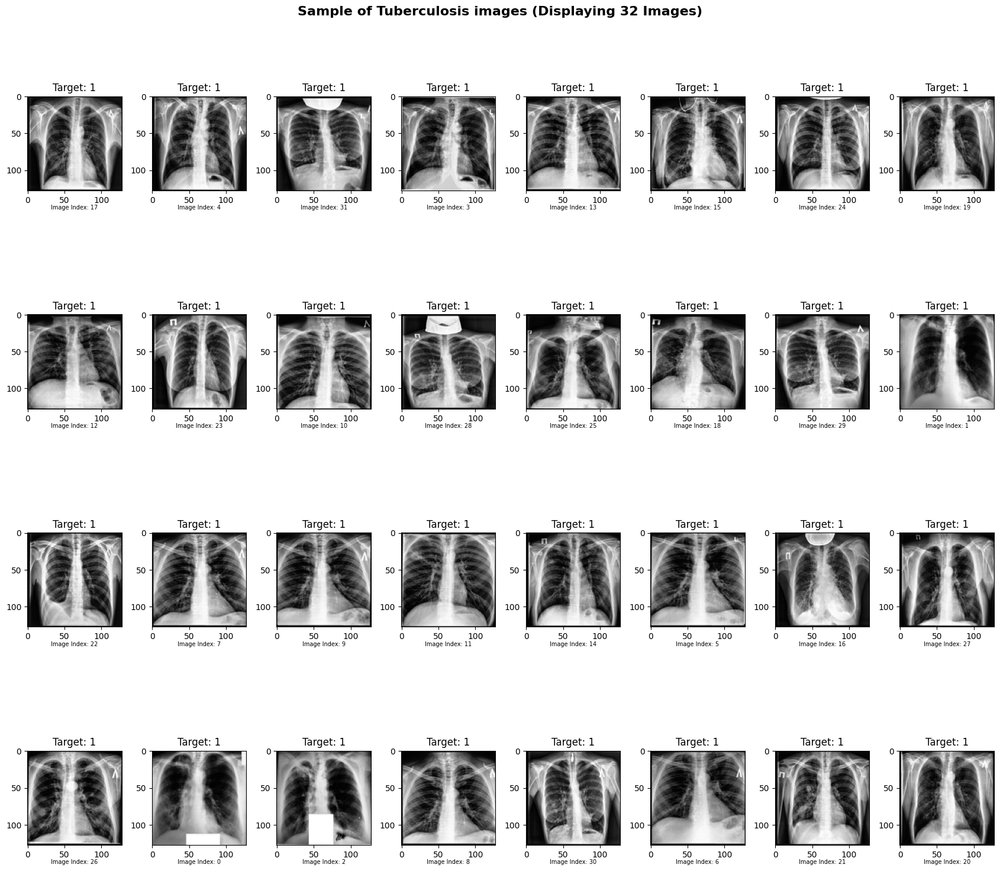

In [16]:
show_image(images=x_tb,
           target=y_tb,
           title='Sample of Tuberculosis images',
           num_display=32,
           num_cols=8,
           cmap='gray',
           random_mode=True)


1.1.4 Image Cropping¶

Problem: Some images in the dataset (Raw data) contain unnecessary blank space, requiring cropping to focus on relevant regions.

Objective: Crop images to remove blank space and focus on specific regions of interest, such as lung areas.

    Pros:
        Improved Focus: Cropping enhances focus on relevant features

    Cons:
        Risk of Information Loss: Over-cropping may remove important information

1.1.4.1 Distribution of Intensity Analysis XNormal
VS XTuberulosis

    Topic: Gray scale Histogram: Distribution of intensity pixel
    Mode: Gray scale
    Plot: Histogram
    **Objective**: aim to compare the distribution of intensity pixels between the datasets of Normal lung X-rays (XNormal) and Tuberculosis (XTuberculosis).

In [17]:
import skimage
from skimage import img_as_float
from skimage import exposure

In [18]:
def plot_gray_scale_histogram(images, titles, bins=55):
    '''
    Plot Gray Scale Histograms of Images.

    Parameters:
        - images (list): List of grayscale images to plot histograms for.
        - titles (list): List of titles for each histogram.
        - bins (int, optional): Number of bins for the histogram. Default is 100.

    Returns:
        None

    This function generates histograms for a list of grayscale images and displays them side by side. Each histogram is accompanied by its respective title.

    The function does not return any values; it displays the histogram plots directly.
    '''
    # Display results
    fig, axes = plt.subplots(2, len(images), figsize=(17, 8))

    for i, (title, image) in enumerate(zip(titles, images)):
        ax_img, ax_hist, ax_cdf, random_index = img_and_hist(
            image, axes[:, i], bins)

        mean_value = np.mean(image)
        median = np.median(image)
        percentile_95 = np.percentile(image, 95)
        std_value = np.std(image)
        min_value = np.min(image)
        max_value = np.max(image)

        ax_img.set_title('Descriptive statistics of '+r'$\bf{' + f'{title}'+'}$' +
                         f'\nMean: {mean_value: .2f}, Std: {std_value: .2f}, Median: {median: .2f},\nPercentile 95: {percentile_95: .2f}, Min: {min_value: .2f}, Max: {max_value: .2f}', fontsize=16)
        ax_img.text(0.5, -0.15, f'Image Index: {random_index}\n(Display random image)', transform=ax_img.transAxes,
                    fontsize=10, ha='center')

        y_min, y_max = ax_hist.get_ylim()
        ax_hist.set_title(
            'Distribution of pixel intensities of'+r'$\bf{' + f'{title}'+'}$', fontsize=16)
        ax_hist.set_ylabel('Number of pixels')
        ax_hist.set_yticks(np.linspace(0, y_max, 5))

        ax_cdf.set_ylabel('Fraction of total intensity')
        ax_cdf.set_yticks(np.linspace(0, 1, 5))

    plt.suptitle('Gray scale Histogram: Distribution of intensity pixel',
                 fontsize=16, fontweight='bold')
    # Prevent overlap of y-axis labels
    fig.tight_layout()
    plt.show()


def img_and_hist(image_data, axes, bins=100):
    '''
    Plot an image along with its histogram and cumulative histogram.

    Parameters:
        - image_data (ndarray): Grayscale image data as a numpy array.
        - axes (list): List of axes for displaying the image, histogram, and cumulative histogram.
        - bins (int): Number of bins for the histogram.

    Returns:
        - ax_img, ax_hist, ax_cdf: Axes objects for image, histogram, and cumulative histogram.

    This function displays an image along with its histogram and cumulative histogram. It takes the grayscale image data, a list of axes for plotting, and the number of bins for the histogram.

    The function returns the axes objects for the image, histogram, and cumulative histogram.
    '''

    '''
    Plot an image along with its histogram and cumulative histogram.
    '''
    image = img_as_float(image_data)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    random_index = np.random.randint(0, len(image_data))

    # Display image
    ax_img.imshow(image if image.shape[0] ==1 else image[random_index], cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    # ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf, random_index


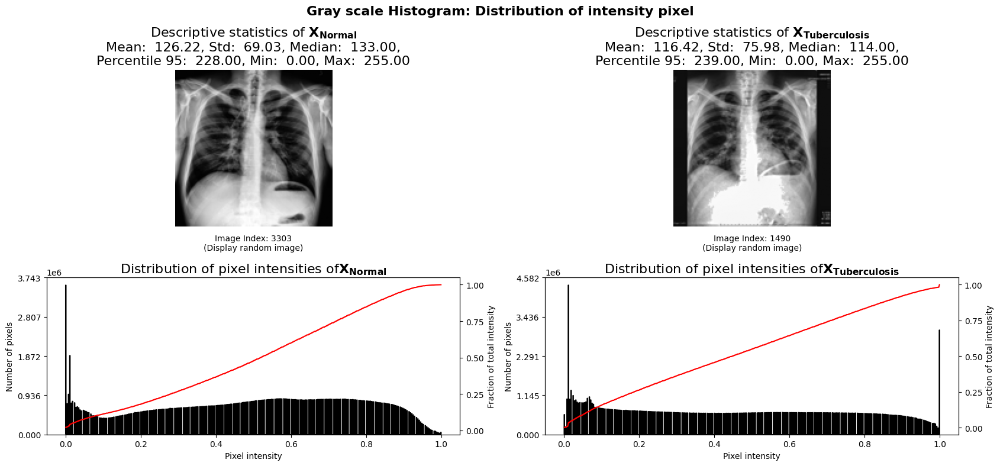

In [19]:
images = [x_norm, x_tb]
subsets = ['X_{Normal}', 'X_{Tuberculosis}']
# For visualization
"""
images: list of numpy.array
subsets: list of string
bins: integer or number that control the shape of distribution for to display
"""
plot_gray_scale_histogram(images=images, titles=subsets, bins=555)


1.1.4.2 Identify Abnormal Image

**Objective**: identify and filter out images with blank white regions based on their statistics.

In [20]:
import cv2
def compute_image_statistics(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Compute image statistics
    mean_intensity = np.mean(gray)
    std_intensity = np.std(gray)
    median_intensity = np.median(gray)
    percentile_95 = np.percentile(gray, 95)

    return mean_intensity, std_intensity, median_intensity, percentile_95

def abnormal_image_identifier(images, labels, subset, thresholds):
    filtered_normal_images = []
    filtered_abnormal_images = []
    filtered_normal_labels = []
    filtered_abnormal_labels = []

    for image, label in zip(images, labels):
        # Compute image statistics
        mean_intensity, std_intensity, median_intensity, percentile_95 = compute_image_statistics(image)

        # Check if image meets filtering criteria
        if (mean_intensity > thresholds['mean_threshold'] and
            std_intensity > thresholds['std_threshold'] and
            median_intensity > thresholds['median_threshold'] and
            percentile_95 > thresholds['percentile_threshold']):
            # Image is abnormal
            filtered_abnormal_images.append(image)
            filtered_abnormal_labels.append(label)
        else:
            # Image is normal
            filtered_normal_images.append(image)
            filtered_normal_labels.append(label)

    summary = f"""Detected Abnormal Images
    Subset: {subset}
    Amount: {len(filtered_abnormal_images)} images
    """

    print(summary)

    return np.array(filtered_normal_images), np.array(filtered_abnormal_images), filtered_normal_labels, filtered_abnormal_labels

In [21]:


constant = 5
tb_thresholds = {
    'mean_threshold': 126-constant,
    'std_threshold': 62-constant,
    'median_threshold': 135-constant,
    'percentile_threshold': 219-constant
}
# Filter images based on thresholds
norm_tb_images, abnorm_tb_images,norm_tb_labels, abnorm_tb_labels  = abnormal_image_identifier(x_tb, y_tb, subset='Tuberculosis', thresholds=tb_thresholds)



Detected Abnormal Images
    Subset: Tuberculosis
    Amount: 89 images
    


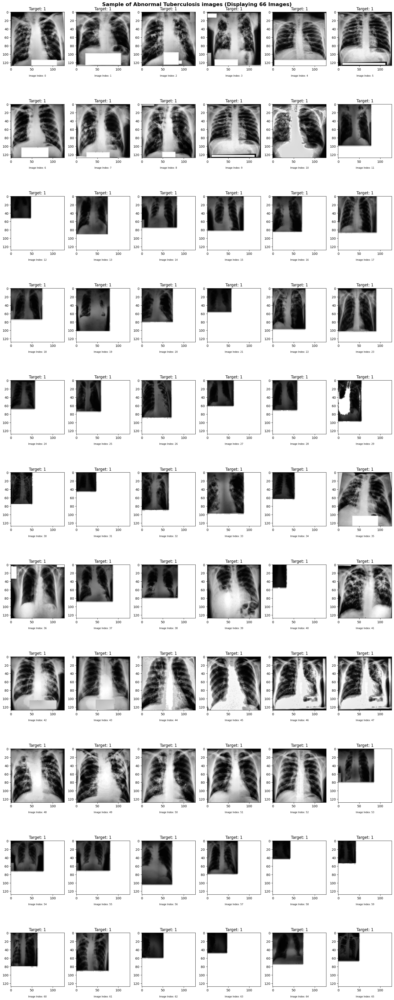

In [22]:
show_image(images=abnorm_tb_images,
           target=abnorm_tb_labels,
           title='Sample of Abnormal Tuberculosis images',
           num_display=66,
           num_cols=6,
           cmap='gray',
           random_mode=False)

In [23]:
constant = 5

norm_thresholds = {
    'mean_threshold': 130 + constant,
    'std_threshold': 66 + constant,
    'median_threshold': 137 +constant,
    'percentile_threshold': 227 +constant
}

# Filter images based on thresholds
norm_norm_images, abnorm_norm_images,norm_norm_labels, abnorm_norm_labels  = abnormal_image_identifier(x_norm, y_norm, subset='Normal', thresholds=norm_thresholds)

Detected Abnormal Images
    Subset: Normal
    Amount: 57 images
    


IndexError: index 57 is out of bounds for axis 0 with size 57

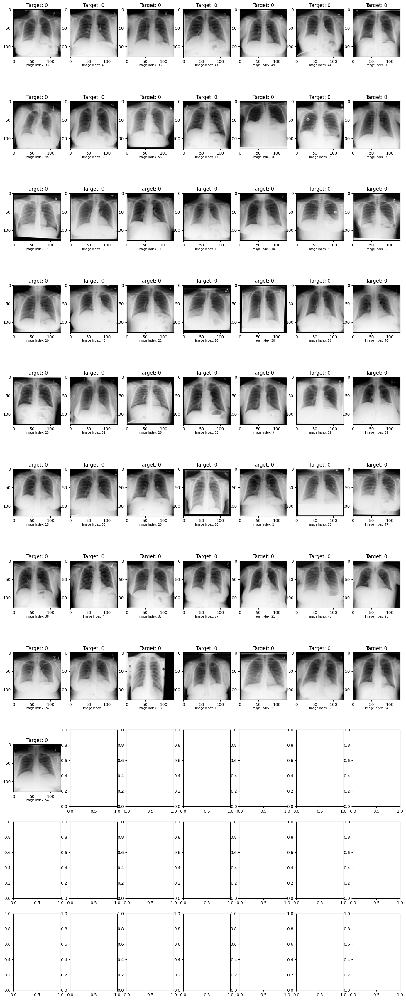

In [24]:
show_image(images=abnorm_norm_images,
           target=abnorm_norm_labels,
           title='Sample of Abnormal Normal images',
           num_display=77,
           num_cols=7,
           cmap='gray',
           random_mode=True)


1.1.4.3 Remove Background

**Objective**: to remove the blank white space in the background of lung images using OpenCV (cv2). Before we proceed with the removal process, we need to construct a function to calculate the threshold using the Interquartile Range (IQR) method for the following purposes:

    Fill suitable Threshold of cv2.threshold: Because we aim to remove the blank white space in the images, it's essential to choose an appropriate threshold value for the cv2.threshold function. However, the intensity of the blank space varies among images, with some spaces closely resembling white but not entirely white (Intensity=255) and others being completely white. Therefore, we need to calculate statistical values to determine a suitable threshold.

    Perform Removal and Cropping: Once we have determined the threshold, we can use cv2.threshold to identify the blank space in the images and select the inverted regions, which represent the lung regions. Then, we crop these regions to create images of the same size (128x128) as the others in the dataset

In [29]:
def cv2_gray_converter(image):
    if len(image.shape) == 3:  # RGB image
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:  # Grayscale image
        gray = image
    return gray

In [30]:
def RBS(image,
        new_size=(128, 128),
        init_intensity=240,
        final_intensity=255):
    """
    RBS (Remove Blank Space):
        RBS Function: It will detect an image whether White/Black depends on range of Intensity range, Incase you want to remove:
            - White, Intensity should be 240 - 255 (Almost White) of Intensity will be selected, and remove it
            - Black,  Intensity should be 0 - 10 (Almost Black) of Intensity will be selected, and remove it
            PS, I used the 95% Percentile value of Tuberculosis group to remove the White Blank Space in their group, And padding parameter created just incase to preserve the edge of an image
    """
    # 1. Condition: To convert the image to grayscale
    gray = cv2_gray_converter(image)
    """
    How cv2.threshold works:
        ret, thresh = cv2.threshold(image, start_intensity_value, end_intensity_value, type_of_thresholding)
        Parameters:
            - image: The input grayscale image.
            - start_intensity_value: The lower threshold intensity value.
            - end_intensity_value: The upper threshold intensity value.
            - type_of_thresholding: The type of thresholding to be applied.
    Example:
        ret, thresh = cv2.threshold(image, 240, 255, cv2.THRESH_BINARY)
        Explanation: This will create a binary threshold image where pixel intensities higher than 240 are set to 255 (white).
    """
    # 2. calculate threshold
    info = f"Intensity Range: {init_intensity} to {final_intensity}"
    # 3. thresholding:
    ret, thresh = cv2.threshold(gray, init_intensity, final_intensity, cv2.THRESH_BINARY_INV)

    """
    Code - Types of Thresholding:
        ret, thresh1 = cv2.threshold(img, 120, 255, cv2.THRESH_BINARY)
        ret, thresh2 = cv2.threshold(img, 120, 255, cv2.THRESH_BINARY_INV)
        ret, thresh3 = cv2.threshold(img, 120, 255, cv2.THRESH_TRUNC)
        ret, thresh4 = cv2.threshold(img, 120, 255, cv2.THRESH_TOZERO)
        ret, thresh5 = cv2.threshold(img, 120, 255, cv2.THRESH_TOZERO_INV)
    """

    """
    Contour Approximation Method:
        - Used to find contours in a binary image (2 colors image).
        - Find contours, represent the boundaries of objects in an image with the same intensity or color.
    """
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the contour with the largest area
    contour = max(contours, key=cv2.contourArea)

    # Find the bounding box of the contour
    x, y, w, h = cv2.boundingRect(contour)

    # Crop the original image using the bounding box
    cropped_image = image[y:y+h, x:x+w]
    cropped_image = cv2.resize(cropped_image, new_size)

    return cropped_image, thresh, info

In [31]:
def DCS(image,
        padding=0,
        init_intensity=10,
        final_intensity=255,
        new_size=(128, 128)):

    """
    DCS (Detect and Crop Subject):
        DCS Function: It will detect an image input in gray where 10 - 255 of Intensity will be selected
    """
    # Convert the image to grayscale
    gray = cv2_gray_converter(image)

    # Apply thresholding to segment the subject (you can use more sophisticated segmentation techniques here)
    ret, thresh = cv2.threshold(gray, init_intensity, final_intensity, cv2.THRESH_BINARY)

    # Find contours
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the contour with the largest area
    contour = max(contours, key=cv2.contourArea)

    # Find the bounding box of the contour
    x, y, w, h = cv2.boundingRect(contour)

    # Draw a rectangle around the detected contour
    cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)  # Bounding box with Red color

    # Crop the subject with padding
    cropped_image = image[max(y - padding if (y - padding) > 0 else 0, 0):min((y + h + padding) if (y + h + padding) > 0 else 0, image.shape[0]),
                         max(x - padding if (x - padding) > 0 else 0, 0):min(x + w + padding if (x + w + padding) else 0, image.shape[1])]
    cropped_image = cv2.resize(cropped_image, new_size)

    return cropped_image

In [32]:
def display_after_remove(images,
                         targets,
                         subset,
                         dcs_init_intensity,
                         dcs_final_intensity,
                         rbs_init_intensity,
                         rbs_final_intensity,
                         padding,

                         new_size=(128, 128),
                         num_display=5,
                         title='Image cropping',
                         random_mode=False):
    cropped_images = []

    if random_mode:
        display_indices = np.random.choice(len(images), num_display, replace=False)
    else:
        display_indices = range(min(num_display, len(images)))
    # Image Processing and Achieve cropped images and targets or labels

    """
    Intensity Variables Declaration
    """
    # Black Intensity Range
    init_black_intensity = 10
    final_black_intensity = 255
    # White Intensity Range
    init_white_intensity = 214
    final_white_intensity = 255

    for image in images:

        # Detect and Crop Subject
        detected_image = DCS(image,
                             padding=padding,
                             init_intensity=init_black_intensity,
                             final_intensity=final_black_intensity,
                             new_size=new_size)

        # Remove white
        cropped_image, thresh, info = RBS(detected_image,
                                                         new_size=new_size,
                                                         init_intensity=init_white_intensity,
                                                         final_intensity=final_white_intensity,
                                                         )
        cropped_images.append(cropped_image)

    # Image Visualization: helps visualize the regions that will be cropped.
    for idx in display_indices:
        uncropped_image = images[idx]
        label = targets[idx]


        # Detect and Crop Subject
        detected_image = DCS(uncropped_image,
                             padding=padding,
                             init_intensity=init_black_intensity,
                             final_intensity=final_black_intensity,
                             new_size=new_size)

        # Remove white
        cropped_image, thresh, info = RBS(detected_image,
                                                         new_size=new_size,
                                                         init_intensity=init_white_intensity,
                                                         final_intensity=final_white_intensity,
                                                         )
        prefix_bold = r'$\bf{'
        suffix_bold = '}$'

        uncropped_title = f"""
            Mode: {Image.fromarray(uncropped_image).mode},
            Size: {Image.fromarray(uncropped_image).size}
            """
        cropped_title = f"""
            Mode: {Image.fromarray(cropped_image).mode},
            Size: {Image.fromarray(cropped_image).size}
            """
        plt.figure(figsize=(12, 6))
        plt.rcParams['axes.titlesize'] = 7

        plt.subplot(1, 4, 1)
        plt.imshow(uncropped_image)
        plt.title(f'{prefix_bold}Input{suffix_bold}: Original Image' + '\n' + uncropped_title, loc='left')

        plt.subplot(1, 4, 2)
        plt.imshow(detected_image)
        plt.title(f'{prefix_bold}Subject-Detection{suffix_bold}\nDetected Subject on Image: \nThreshold + Contours,\nCropping + ({padding}) Padding ')

        plt.subplot(1, 4, 3)
        plt.imshow(thresh, cmap='RdYlGn')
        plt.title(f"{prefix_bold}Threshold-Image{suffix_bold}\n{info}", fontsize=7)

        plt.subplot(1, 4, 4)
        plt.imshow(cropped_image)
        plt.title(f'{prefix_bold}Output{suffix_bold}: Cropped Image' + '\n' + cropped_title, loc='left')

        plt.suptitle(title + f"\n{prefix_bold}Subset{suffix_bold}: {subset}", font='bold')
        plt.show()

    return np.array(cropped_images), targets

In [33]:
tb_thresholds

{'mean_threshold': 121,
 'std_threshold': 57,
 'median_threshold': 130,
 'percentile_threshold': 214}

findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family ['bold'] not found. Falling back to DejaVu Sans.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.


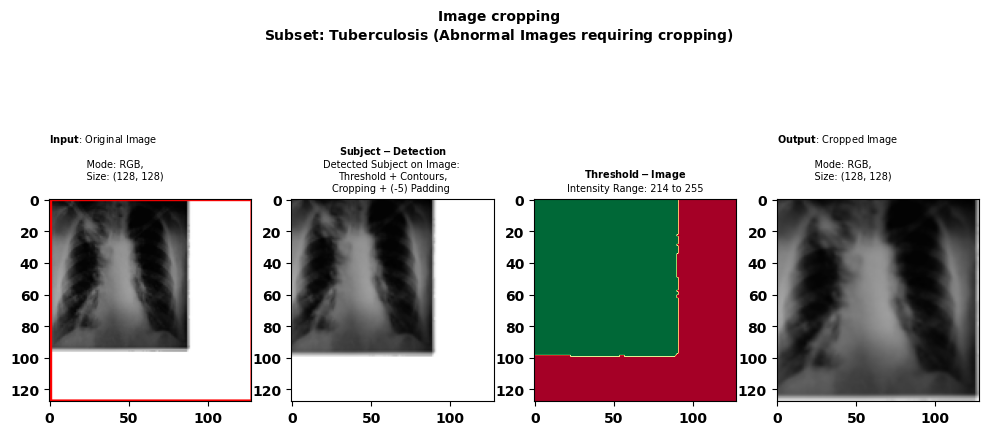

findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.


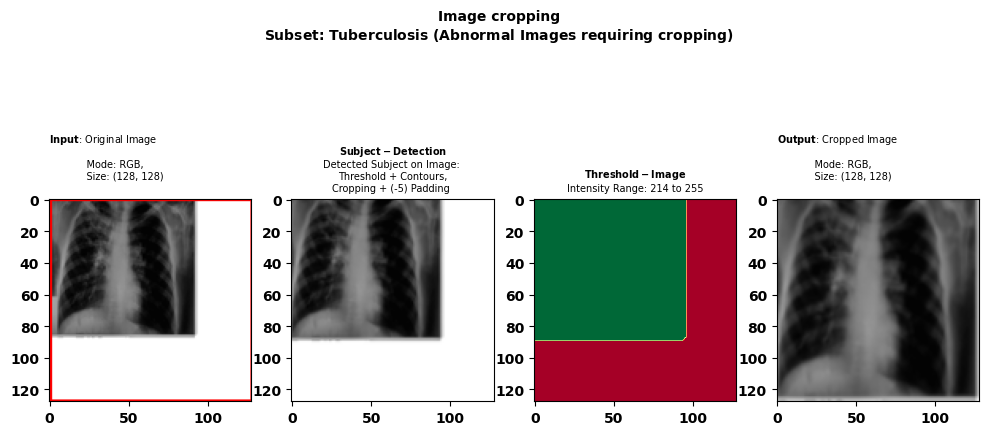

findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.


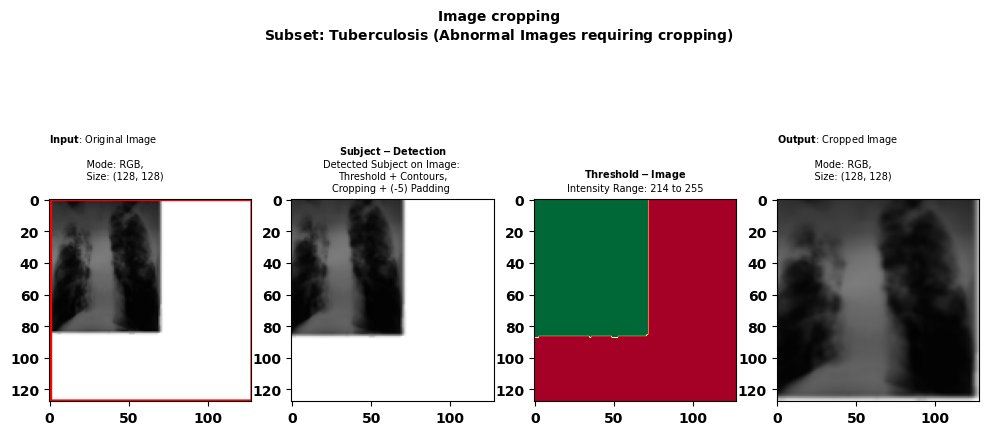

findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.


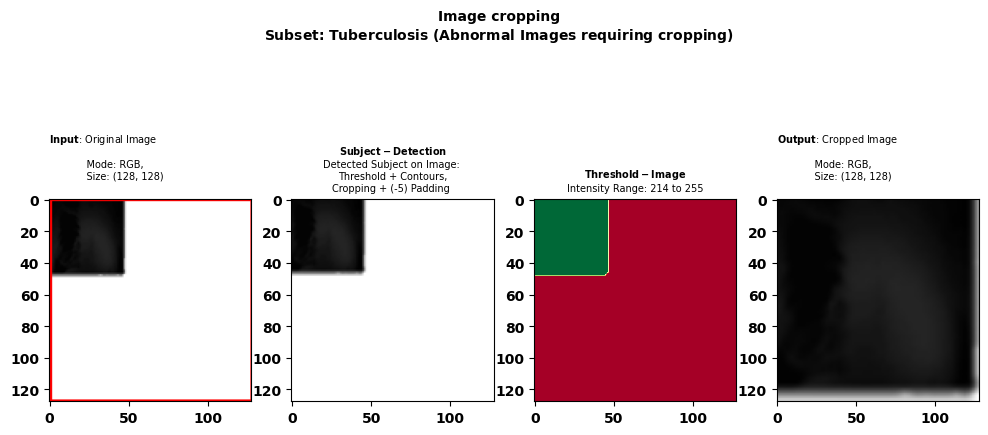

findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.


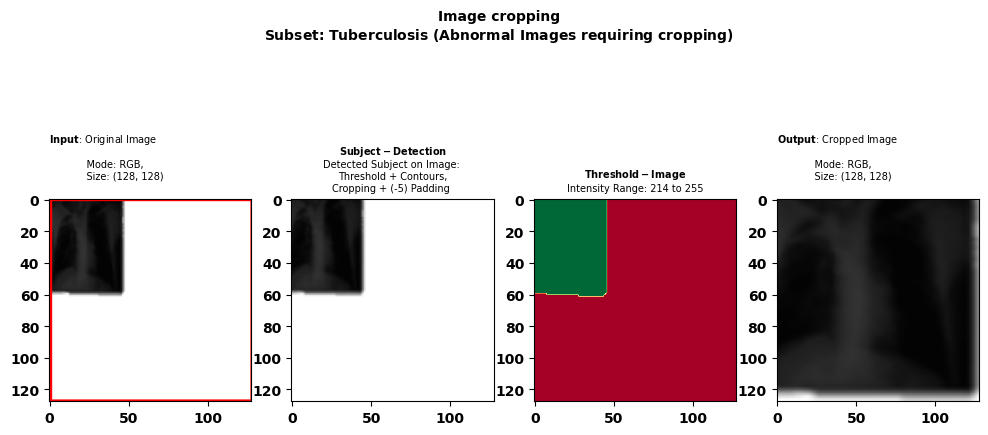

findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.


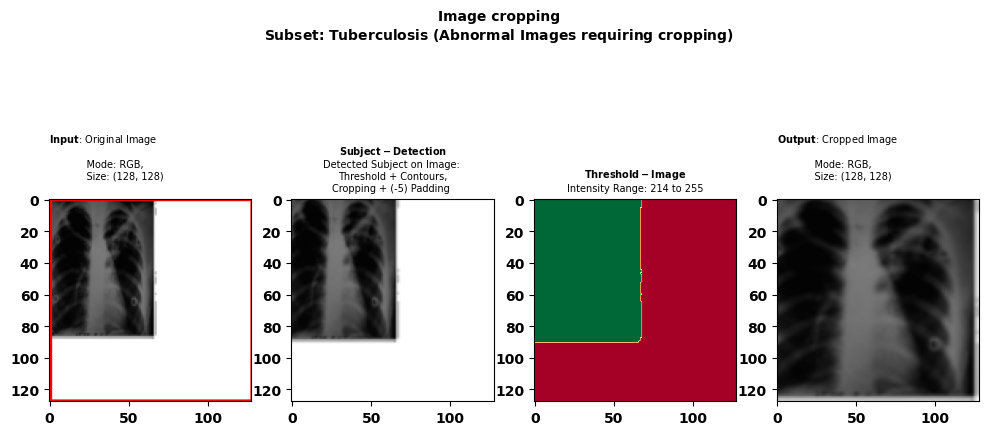

findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.


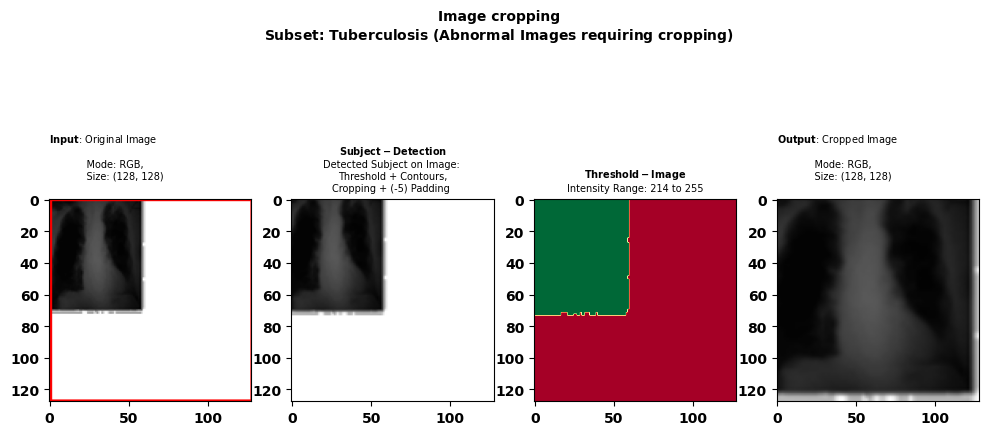

findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.


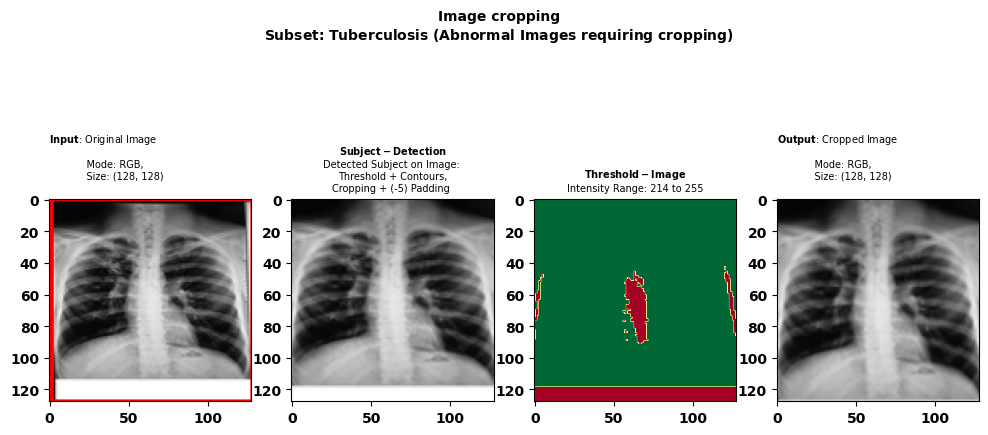

findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.


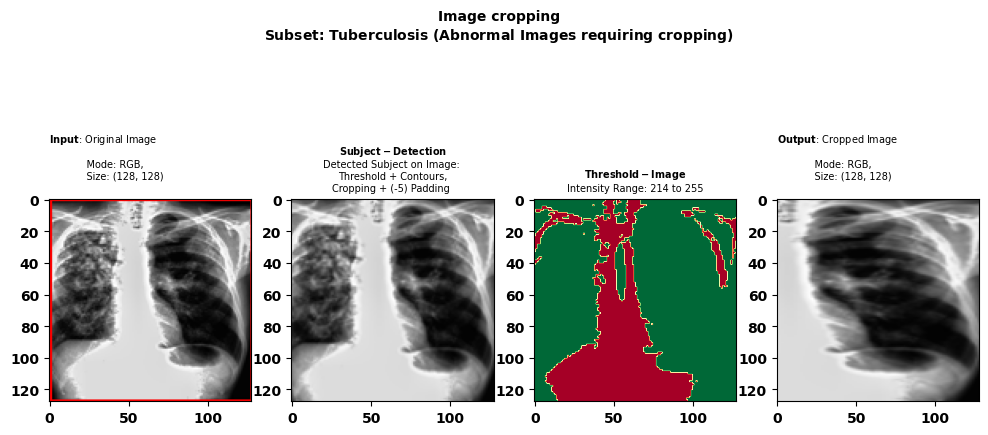

findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.
findfont: Font family 'bold' not found.


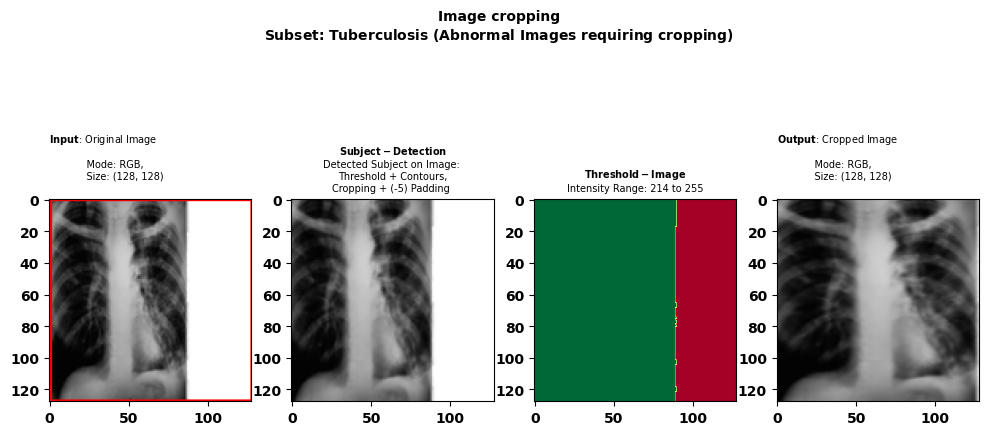

In [38]:
# Set the default font family and weight
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.weight'] = 'bold'

# Continue with your code
tb_cropped_images, tb_cropped_labels = display_after_remove(images=abnorm_tb_images,
                                              targets=abnorm_tb_labels,
                                              subset="Tuberculosis (Abnormal Images requiring cropping)",
                                              dcs_init_intensity=10,
                                              dcs_final_intensity=255,
                                              rbs_init_intensity=tb_thresholds['percentile_threshold'],
                                              rbs_final_intensity=255,
                                              padding=-5,
                                              new_size=(128, 128),
                                              num_display=10,
                                              title='Image cropping',
                                              random_mode=True)

In [39]:
tb_cropped_images.shape

(89, 128, 128, 3)

In [40]:
# show_image(images=tb_cropped_images,
#            target=tb_cropped_labels,
#            title='Sample of Tuberculosis Cropped-Images',
#            num_display=66,
#            num_cols=6,
#            cmap='gray',
#            random_mode=False)


1.1.5 Data Preparation

Objective: prepare data to facilitate further Data Augmentation processing. We will create explicit variables that are easy to call and work with.

    X; representing 7,000 samples, each with a size of 128x128 pixels. contains
        Normal images
            x_norm: representing 3,500 images
        Tuberculosis images
            x_tb: representing 700 images
                Normal images:
                    norm_tb_images: representing 633 images
                Abnormal images:
                    abnorm_tb_images: representing 67 images

    y; represents the binary classification labels, where 0 represents a normal image, 1 represents a TB image.
        Normal labels:
            y_norm: representing 3,500 labels
        Tuberculosis labels:
            y_tb: representing 700 labels
                Normal labels:
                    norm_tb_labels: representing 633 labels
                Abnormal labels:
                    abnorm_tb_labels: representing 67 labels



In [41]:
# Concatenate
X_tb = np.concatenate((norm_tb_images, tb_cropped_images), axis=0)

# Concatenate
y_tb = np.concatenate((norm_tb_labels, tb_cropped_labels), axis=0)

In [42]:
X_tb.shape

(3500, 128, 128, 3)

In [43]:
y_tb.shape

(3500,)


1.3 Normalizing the pixel values

In [44]:
# Scaled the subset of dataset before do Augmentation
X_tb = X_tb/255

# So do the others
x_norm = x_norm/255

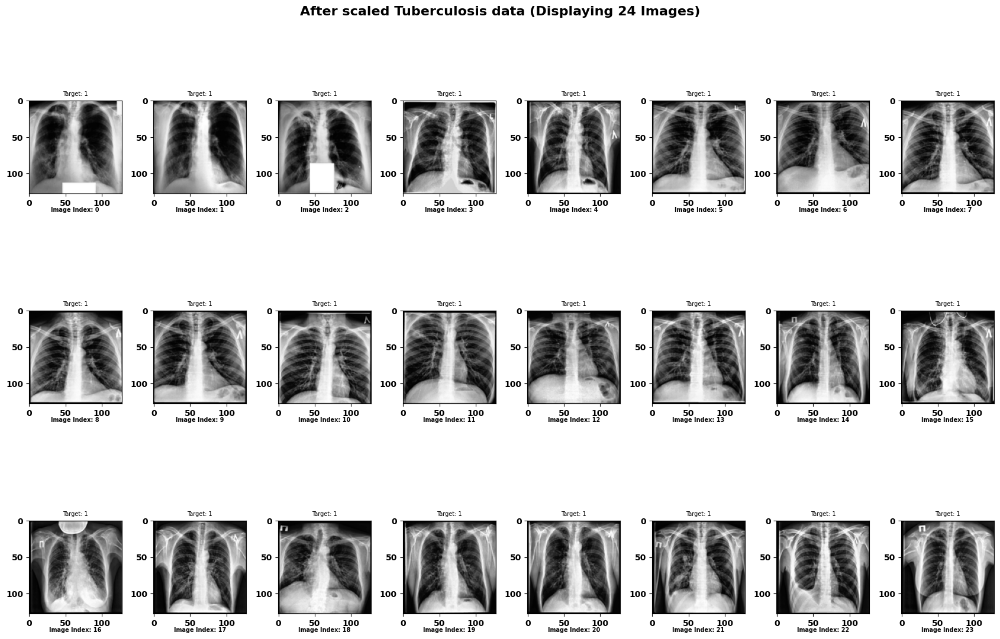

In [45]:
show_image(images=X_tb,
           target=y_tb,
           title='After scaled Tuberculosis data',
           num_display=24,
           num_cols=8,
           cmap='gray',
           random_mode=False)

data argumentation

In [46]:
# X_tb_augmented, y_tb_augmented = x_ray_image_augmentation(images=X_tb,
#                                                          targets=y_tb,
#                                                          sample_count=3500)

In [47]:
# X_tb_augmented.shape

In [48]:
# y_tb_augmented

In [49]:
# # New image indexes, started at 700-3500
# start_index = 700
# end_index = 3500

# show_image(images=X_tb_augmented[start_index:end_index],
#            target=y_tb_augmented[start_index:end_index],
#            title='After Data Augmentation on Tuberculosis Images',
#            num_display=24,
#            num_cols=8,
#            cmap='gray',
#            random_mode=True)

In [50]:
# Concatenate x_norm and x_tb along the first axis (samples)
X_balanced = np.concatenate((x_norm, X_tb), axis=0)

# Concatenate y_norm and target_tb
y_balanced = np.concatenate((y_norm,  y_tb), axis=0)

In [51]:
X_balanced.shape

(7000, 128, 128, 3)

In [52]:
y_balanced.shape

(7000,)


1.5 Image Enhancement¶

Image Pre-processing for Chest X-ray

used to improve their visual quality and enhance the details within the images.

Aim:

    Improve the visibility of details in the image
    Enhance the contrast of the image

1.5.1 Contrast Stretching:

    Objective: Enhance the visibility of details and improve contrast in an image.
    Goal: Increase the dynamic range of pixel values by stretching the intensity values to a desired range.



In [53]:
# from skimage import exposure

In [54]:
# def contrast_stretching(X):
#     p2, p98 = np.percentile(X, (2, 98))
#     stretched_img = exposure.rescale_intensity(X, in_range=(p2, p98))
#     return stretched_img

In [55]:
# X_stretched = contrast_stretching(X_balanced[0:16])
# y_stretched = y_balanced[0:16]
# show_image(images=X_stretched,
#            target=y_stretched,
#            title='Contrast Stretching images',
#            num_display=16,
#            num_cols=4,
#            cmap='gray',
#            random_mode=True)

CNN

create class of cnn

In [56]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Flatten, Dropout, Dense
from sklearn.model_selection import KFold
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import accuracy_score

In [57]:
from tensorflow.keras import mixed_precision

# Enable mixed precision training
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)

class CNN(BaseEstimator, ClassifierMixin):
    def __init__(self,
                 # CNN Architecture
                 input_shape=(128, 128, 3),
                 unit_multiplier=1.0,
                 # CNN Hyperparameters
                 conv_padding='same',
                 conv_kernel_size=(3, 3),
                 conv_stride=1,
                 pool_padding='same',
                 pool_kernel_size=(2, 2),
                 pool_stride=2,
                 dropout=0,
                 l1_lambda=None,
                 l2_lambda=None,
                 pooling_type='max',
                 # Adam Optimizer Configuration (Default)
                 learning_rate=0.001,
                 beta1=0.9,
                 beta2=0.999,
                 epsilon=1e-07,
                 # Training Configuration
                 batch_size=32,
                 epochs=10,
                 verbose=0,
                 metrics=['accuracy'],
                 ):

        self.input_shape = input_shape
        self.unit_multiplier = unit_multiplier
        self.conv_padding = conv_padding
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.pool_padding = pool_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.dropout = dropout
        self.l1_lambda = l1_lambda
        self.l2_lambda = l2_lambda
        self.pooling_type = pooling_type
        self.learning_rate = learning_rate
        self.beta1 = beta1
        self.beta2 = beta2
        self.epsilon = epsilon
        self.metrics = metrics
        self.batch_size = batch_size
        self.epochs = epochs
        self.verbose = verbose
        self.model = self.architecturize()

    def architecturize(self):
        reg_l1 = None
        reg_l2 = None

        if self.l1_lambda is not None:
            reg_l1 = tf.keras.regularizers.l1(self.l1_lambda)

        if self.l2_lambda is not None:
            reg_l2 = tf.keras.regularizers.l2(self.l2_lambda)

        model = Sequential()
        model.add(Conv2D(
            int(32 * self.unit_multiplier),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            activation='relu',
            kernel_regularizer=reg_l1,
            input_shape=self.input_shape))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(64 * self.unit_multiplier),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(128 * self.unit_multiplier),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Flatten())
        model.add(Dense(
            units=int(128 * self.unit_multiplier),
            activation='relu',
            kernel_regularizer=reg_l2))

        model.add(Dropout(self.dropout))
        model.add(Dense(units=1, activation='sigmoid', dtype='float32'))  # Specify dtype for final layer

        # Adam Optimizer Algorithm
        self.optimizer = tf.keras.optimizers.Adam(
                learning_rate=self.learning_rate,
                beta_1= self.beta1,
                beta_2= self.beta2,
                epsilon=self.epsilon,
            )
        model.compile(loss='binary_crossentropy',
                      optimizer=self.optimizer,
                      metrics=self.metrics)

        return model

    def predict_(self, X, threshold=0.5):

        probabilities = self.model.predict(X, verbose=self.verbose)
        binary_predictions = (probabilities > threshold).astype("int32")
        return binary_predictions, probabilities

    def fit(self, X, y):
        self.model.fit(X, y, epochs=self.epochs, batch_size=self.batch_size, verbose=self.verbose)
        return self

    def predict(self, X):
        return self.model.predict(X)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

    def summary(self):
        self.model.summary()

    def cv(self, X, y, epochs=10, batch_size=16, cv=5, verbose=1):
        kf = KFold(n_splits=cv, shuffle=True)
        scores = []
        for train_index, test_index in kf.split(X):
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y[train_index], y[test_index]
            self.model.fit(X_train, y_train, epochs=epochs if epochs else self.epochs, batch_size=batch_size if batch_size else self.batch_size, verbose=verbose if verbose else self.verbose)
            _, accuracy = self.model.evaluate(X_test, y_test, verbose=self.verbose)
            scores.append(accuracy)
        return scores

    def train(self, X_train, y_train, X_val, y_val, epochs=None, batch_size=None):
        if epochs is None:
            epochs = self.epochs
        if batch_size is None:
            batch_size = self.batch_size

        steps_per_epoch = len(X_train) // batch_size
        validation_steps = len(X_val) // batch_size

        history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            validation_data=(X_val, y_val),
            verbose=self.verbose,
        )
        return history


The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


In [58]:
cnn = CNN(unit_multiplier=1,
          input_shape=(128,128,3))


In [59]:
cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 16, 16, 128)      0


3. Splitting the Dataset:

Spliting.png

Split the dataset into training, validation, and test sets. The usual split ratios are

    80% for training,
    10% for validation,
    and 10% for testing.

Ensure that the classes are balanced in each split.


In [60]:
from sklearn.model_selection import train_test_split

In [61]:
def viz_class_distribution(X, y, title, classe_labels, train_percent=0.8, val_percent=0.1, test_percent=0.1, show_plot=True):
    '''
    :Parameters:
    - X (numpy array): The input feature matrix of shape (num_examples, num_features).
    - y (numpy array): The target labels of shape (num_examples,).
    - title (str): The title for the entire plot.
    - classes (list): A list of class labels, e.g., ['Normal', 'Tuberculosis'].
    - train_percent (float): Percentage of data for training set.
    - val_percent (float): Percentage of data for validation set.
    - test_percent (float): Percentage of data for test set.
    - show_plot (Boolean): True or False of d

    :Returns:
    - X_train, y_train, X_test, y_test, X_val, y_val: The subsets of the data.
    '''
    assert train_percent + val_percent + test_percent == 1.0, "Sum of train_percent, val_percent, and test_percent should be 1.0"

    # Convert y to integers
    y = y.astype(int)

    # Split the data
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=val_percent + test_percent, random_state=42, stratify=y)

    test_size = test_percent / (val_percent + test_percent)
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=test_size, random_state=42, stratify=y_temp)
    if show_plot:
        # Create a subplot with 3 columns and 1 row
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))

        # List of subset names
        subset_names = ['Train', 'Test', 'Validation']
        n = len(X)

        # Iterate over subsets
        for i, subset in enumerate([(X_train, y_train), (X_test, y_test), (X_val, y_val)]):
            X_subset, y_subset = subset
            n_subset = len(y_subset)
            # Get the class counts
            class_counts = np.bincount(y_subset)

            # Plot histogram for the current subset
            axs[i].bar(classe_labels, class_counts, color='#AA99FF')
            subtitle = r'$\bf{' + subset_names[i] + \
                '}$' + f' {int(n_subset/n*100)} %'
            axs[i].set_title(
                subtitle + f'\n Size = {X_subset.shape[0]}', fontsize=18)
            axs[i].set_xlabel('Class')
            axs[i].set_ylabel('Number of examples')

            # Add labels to the bars
            for j, count in enumerate(class_counts):
                axs[i].text(j, count, str(count), ha='center',
                            va='bottom', fontsize=12)

        class_counts = np.bincount(y)
        class_balance_text = ' | '.join(
            [f'{class_label} ({count})' for class_label, count in zip(classe_labels, class_counts)])
        plt.suptitle(f'{title}' + f'\n Training examples (X): {X.shape[0]}' +
                     f'\nTarget (y): {class_balance_text}', fontsize=20)

        plt.tight_layout()
        plt.show()

    return X_train, y_train, X_test, y_test, X_val, y_val


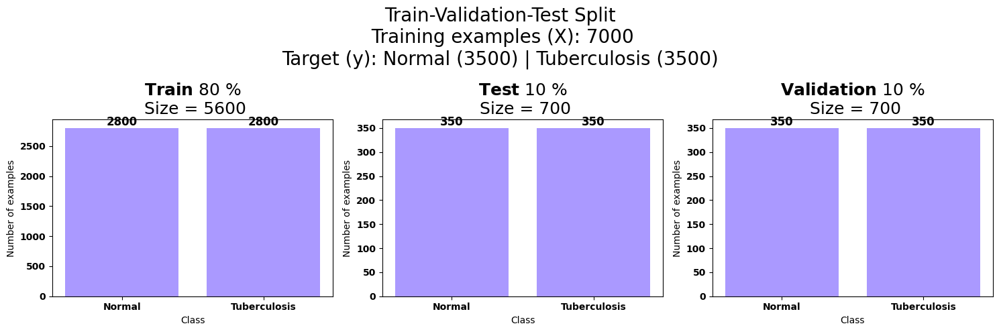

In [62]:
X_train, y_train, X_test, y_test, X_val, y_val = viz_class_distribution(X=X_balanced,
                        y=y_balanced,
                        title='Train-Validation-Test Split',
                        classe_labels=['Normal', 'Tuberculosis'],
                        train_percent=0.8,
                        val_percent=0.1,
                        test_percent=0.1)

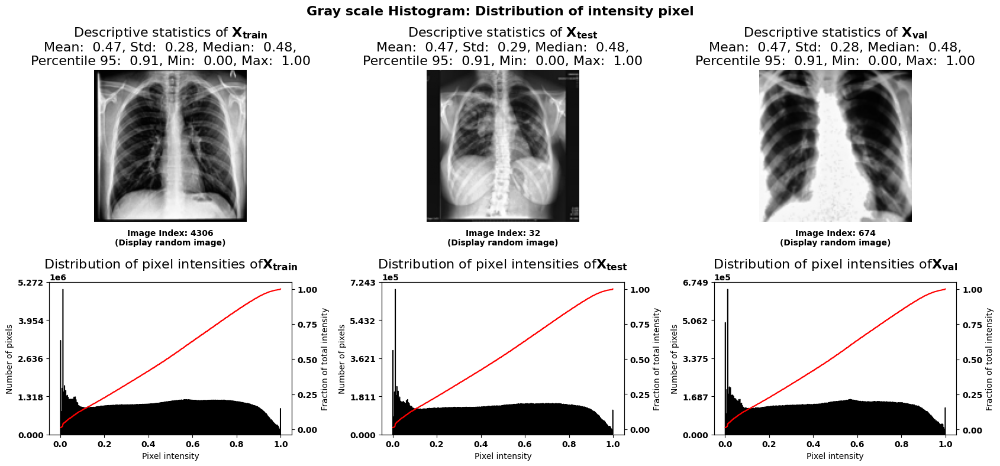

In [63]:
images = [X_train, X_test, X_val]
subsets = ['X_{train}', 'X_{test}', 'X_{val}']
# For visualization
plot_gray_scale_histogram(images=images, titles=subsets, bins=555)


4. Modeling

Learning Problem: Binary Classification
4.1 Experimental Plan

    Experiment A - Baseline Performance
    Experiment B - Data Sampling Technique or Data Augmentation
    Experiment C - Image Size
    Experiment D - Image Mode: RGB vs. Grayscale
    Experiment E - Image Enhancement

4.1.1. Experiment A - Baseline Performance:

The baseline performance is evaluated without applying any technique to the dataset. (128x128, Dataset contains Both RGB and Grayscale, Class Ratio is 3,500: 3,500)

In [64]:
epochs = 10
batch_size = 64

In [65]:
cnn1 = CNN(unit_multiplier=0.05,
          input_shape=(128,128,3))
cnn1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 128, 128, 1)       28        
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 64, 64, 1)        0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 64, 3)         30        
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 32, 32, 3)        0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 32, 32, 6)         168       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 16, 16, 6)       

In [ ]:
history = cnn1.train(X_train, y_train, X_val, y_val,
                   epochs=epochs,
                   batch_size=batch_size)


In [77]:
def plot_history(history):
    # Accuracy
    plt.plot(history.history['accuracy'], c = 'royalblue', linewidth = 2.5, label = 'Training')
    plt.plot(history.history['val_accuracy'], c = 'firebrick', linestyle = '--', label = 'Valid')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left', frameon = True, facecolor = 'white')
    plt.show()

    # Loss
    plt.plot(history.history['loss'], c = 'royalblue', linewidth = 2.5, label = 'Training')
    plt.plot(history.history['val_loss'], c = 'firebrick', linestyle = '--', label = 'Valid')
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left',frameon = True, facecolor = 'white')
    plt.show()

In [ ]:
plot_history(history)

EVALUATION

In [68]:
import json
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, accuracy_score, roc_curve, roc_auc_score, f1_score, auc

In [69]:
def evaluate(estimator, estimator_tag, experiment_tag, X_train, y_train, X_test, y_test, X_val, y_val):
    """
    Evaluate the performance of a model on different subsets of data.

    Args:
    - estimator: The trained model object
    - estimator_tag: Identifier for the model
    - experiment_tag: Identifier for the Experiment
    - X_train: Training data
    - y_train: Training labels
    - X_test: Test data
    - y_test: Test labels
    - X_val: Validation data
    - y_val: Validation labels

    Returns:
    - evaluation_results: DataFrame containing evaluation metrics
    """
    subsets = {'Train': (X_train, y_train), 'Test': (X_test, y_test), 'Validation': (X_val, y_val)}
    performances = []
    for subset_name, (X_subset, y_actual) in subsets.items():
        # Model Prediction/Y hat
        # y_pred_binary_predictions, y_probabilities

        y_pred, y_prob = estimator.predict_(X_subset)

        # Calculate ROC curve and AUC score
        fpr, tpr, thresholds = roc_curve(y_actual, y_prob)
        auc_score = auc(fpr, tpr)

        # Classification Report
        report = classification_report(y_actual, y_pred, output_dict=True)
        report_dict = json.loads(json.dumps(report))

        # Extract precision and recall from report_dict
        precision = report_dict['weighted avg']['precision']
        recall = report_dict['weighted avg']['recall']
        accuracy = report_dict['accuracy']
        f1_score = report_dict['weighted avg']['f1-score']

        # Confusion Matrix
        cm = confusion_matrix(y_actual, y_pred)
        TP = cm[0][0]
        FP = cm[0][1]
        FN = cm[1][0]
        TN = cm[1][1]

        sensitivity = TP / (TP + FN)  # Sensitivity or True Positive Rate
        specificity = TN / (TN + FP)  # Specificity or True Negative Rate

        performance = {
            'Model': estimator_tag,
            'Experiment_tag':experiment_tag,
            'Subset': subset_name,
            'FPR':fpr,
            'TPR':tpr,
            'TP': TP,
            'FP': FP,
            'FN': FN,
            'TN': TN,
            'Precision': precision,
            'Recall': recall,
            'Sensitivity': sensitivity,
            'Specificity': specificity,
            'F1 Score': f1_score,
            'AUC': auc_score,
            'Accuracy': accuracy,
        }

        performances.append(performance)

    return pd.DataFrame(performances)

In [78]:
evaluation_1 = evaluate(cnn1,
                        'CNN_1_Baseline',
                        'A',
                        X_train,
                        y_train,
                        X_test,
                        y_test,
                        X_val,
                        y_val)

In [ ]:
evaluation_1

In [71]:
def plot_confusion_matrix(estimator,X,  y, subset_name):
    y_pred, y_prob = estimator.predict_(X)

    cm = confusion_matrix(y, y_pred)
    labels = ['Negative', 'Positive']

    # Extract TP, TN, FP, FN
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)  # Sensitivity or True Positive Rate
    specificity = tn / (tn + fp)  # Specificity or True Negative Rate

    plt.figure(figsize=(18, 9))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=labels, yticklabels=labels)



    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {subset_name}\n'
              f'True Positives: {tp} | True Negatives: {tn}\n'
              f'False Positives: {fp} (Type I error) | False Negatives: {fn} (Type II error)\n'
              f'Sensitivity (True Positive Rate): {sensitivity:.4f} | Specificity (True Negative Rate): {specificity:.4f}',
              loc='center', wrap=True)
    plt.show()

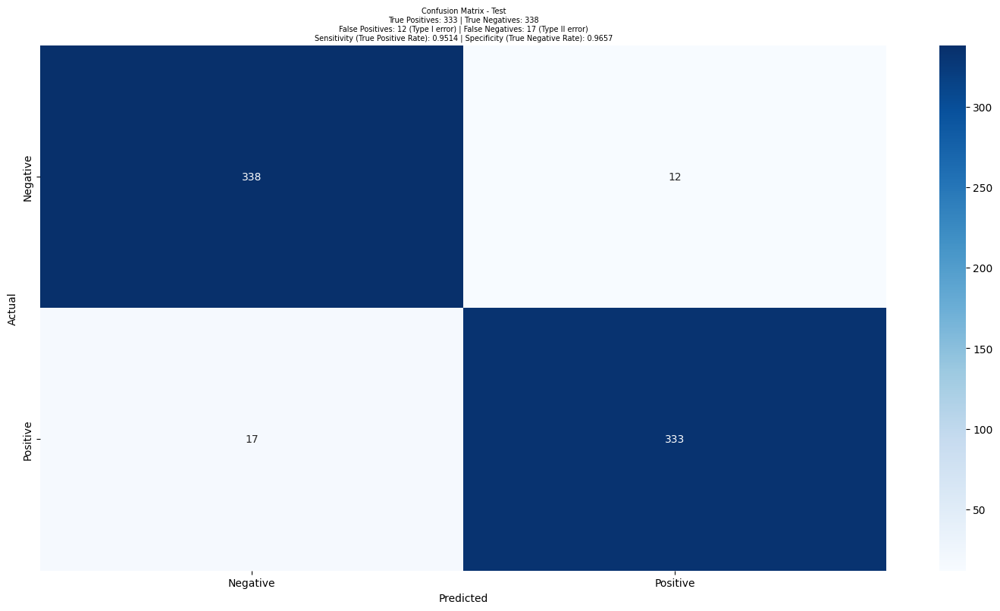

In [75]:
import seaborn as sns
plot_confusion_matrix(estimator=cnn1,
                      X=X_test,
                      y=y_test,
                      subset_name='Test')

In [79]:
#save model
cnn1.model.save('cnn_model.h5')

4.1.2. Experiment E - Image Enhancement:¶

What is Image enhancement technique give us the best Performance?, considering Image enhancement technique such as:

    Contrast Stretching
    Histogram Equalization
    Adaptive Histogram Equalization


In [ ]:
# X_stretched = contrast_stretching(X_balanced)

In [ ]:
# images = [X_balanced, X_stretched]
# subsets = ['X_{balanced}', 'X_{Contrast-Stretching}']
# # For visualization
# plot_gray_scale_histogram(images=images,
#                           titles=subsets,
#                           bins=555)


In [ ]:
# X_train, y_train, X_test, y_test, X_val, y_val = viz_class_distribution(X=X_stretched,
#     y=y_balanced,
#     title='Class Distribution in Train-Validation-Test Split (X_stretched)',
#     classe_labels=['Normal', 'Tuberculosis'],
#     train_percent=0.8,
#     val_percent=0.1,
#     test_percent=0.1,
#                                                                         show_plot=False)

In [ ]:
# cnn5 = CNN(unit_multiplier=0.05,
#         input_shape=(128,128,3))
# cnn5.summary()

In [ ]:


# history5 = cnn5.train(X_train, y_train, X_val, y_val,
#                         epochs=epochs,
#                         batch_size=batch_size)



In [ ]:
# evaluation_5 = evaluate(cnn5,
#                     'CNN_5_Contrast-Stretching',
#                     'E',
#                     X_train,
#                     y_train,
#                     X_test,
#                     y_test,
#                     X_val,
#                     y_val)

USING DENSENET

In [83]:
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold

class DenseNet201(BaseEstimator, ClassifierMixin):
    def __init__(self, 
                 input_shape=(128, 128, 3), 
                 unit_multiplier=1.0, 
                 dropout=0, 
                 l2_lambda=None,
                 learning_rate=0.001,
                 beta1=0.9,
                 beta2=0.999,
                 epsilon=1e-07,
                 batch_size=32,
                 epochs=10,
                 verbose=0,
                 metrics=['accuracy'],
                 ):
        
        self.input_shape = input_shape
        self.unit_multiplier = unit_multiplier
        self.dropout = dropout
        self.l2_lambda = l2_lambda
        self.learning_rate = learning_rate
        self.beta1 = beta1
        self.beta2 = beta2
        self.epsilon = epsilon
        self.metrics = metrics
        self.batch_size = batch_size
        self.epochs = epochs
        self.verbose = verbose
        self.model = self.architecturize()

    def architecturize(self):
        reg_l2 = tf.keras.regularizers.l2(self.l2_lambda) if self.l2_lambda else None

        def dense_block(x, blocks, name):
            for i in range(blocks):
                x = conv_block(x, 32, name=name + '_block' + str(i + 1))
            return x

        def transition_block(x, reduction, name):
            x = layers.BatchNormalization(epsilon=1.001e-5, name=name + '_bn')(x)
            x = layers.Activation('relu', name=name + '_relu')(x)
            x = layers.Conv2D(int(tf.keras.backend.int_shape(x)[-1] * reduction), 1,
                              use_bias=False, name=name + '_conv')(x)
            x = layers.AveragePooling2D(2, strides=2, name=name + '_pool')(x)
            return x

        def conv_block(x, growth_rate, name):
            x1 = layers.BatchNormalization(epsilon=1.001e-5, name=name + '_0_bn')(x)
            x1 = layers.Activation('relu', name=name + '_0_relu')(x1)
            x1 = layers.Conv2D(4 * growth_rate, 1, use_bias=False, name=name + '_1_conv')(x1)
            x1 = layers.BatchNormalization(epsilon=1.001e-5, name=name + '_1_bn')(x1)
            x1 = layers.Activation('relu', name=name + '_1_relu')(x1)
            x1 = layers.Conv2D(growth_rate, 3, padding='same', use_bias=False, name=name + '_2_conv')(x1)
            x = layers.Concatenate(name=name + '_concat')([x, x1])
            return x

        inputs = layers.Input(shape=self.input_shape)
        x = layers.Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(inputs)
        x = layers.BatchNormalization(epsilon=1.001e-5, name='conv1/bn')(x)
        x = layers.Activation('relu', name='conv1/relu')(x)
        x = layers.MaxPooling2D(3, strides=2, name='pool1')(x)

        x = dense_block(x, 6, name='conv2')
        x = transition_block(x, 0.5, name='pool2')
        x = dense_block(x, 12, name='conv3')
        x = transition_block(x, 0.5, name='pool3')
        x = dense_block(x, 48, name='conv4')
        x = transition_block(x, 0.5, name='pool4')
        x = dense_block(x, 32, name='conv5')

        x = layers.BatchNormalization(epsilon=1.001e-5, name='bn')(x)
        x = layers.GlobalAveragePooling2D(name='avg_pool')(x)
        x = layers.Dense(1, activation='sigmoid', name='fc')(x)

        model = models.Model(inputs, x, name='densenet201')

        self.optimizer = tf.keras.optimizers.Adam(
                learning_rate=self.learning_rate,
                beta_1=self.beta1,
                beta_2=self.beta2,
                epsilon=self.epsilon,
            )

        model.compile(loss='binary_crossentropy',
                      optimizer=self.optimizer,
                      metrics=self.metrics)

        return model

    def predict_(self, X, threshold=0.5):
        probabilities = self.model.predict(X, verbose=self.verbose)
        binary_predictions = (probabilities > threshold).astype("int32")
        return binary_predictions, probabilities
    
    def fit(self, X, y):
        self.model.fit(X, y, epochs=self.epochs, batch_size=self.batch_size, verbose=self.verbose)
        return self
    
    def predict(self, X):
        return self.model.predict(X)

    def score(self, X, y):
        y_pred = self.predict(X)
        y_pred_binary = (y_pred > 0.5).astype(int)
        return accuracy_score(y, y_pred_binary)
    
    def summary(self):
        self.model.summary()
        
    def cv(self, X, y, epochs=10, batch_size=16, cv=5, verbose=1):
        kf = KFold(n_splits=cv, shuffle=True)
        scores = []
        for train_index, test_index in kf.split(X):
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y[train_index], y[test_index]
            self.model.fit(X_train, y_train, epochs=epochs if epochs else self.epochs, batch_size=batch_size if batch_size else self.batch_size, verbose=verbose if verbose else self.verbose)
            _, accuracy = self.model.evaluate(X_test, y_test, verbose=self.verbose)
            scores.append(accuracy)
        return scores
    
    def train(self, X_train, y_train, X_val, y_val, epochs, batch_size):
        steps_per_epoch = len(X_train) // batch_size
        validation_steps = len(X_val) // batch_size
        
        history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            validation_data=(X_val, y_val),
            verbose=self.verbose,
        )
        return history

In [84]:
# Create an instance of the DenseNet201 class
densenet201 = DenseNet201(unit_multiplier=0.05, input_shape=(128, 128, 3))

# Print the summary of the DenseNet201 model architecture
densenet201.summary()

Model: "densenet201"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1/conv (Conv2D)            (None, 61, 61, 64)   9408        ['input_2[0][0]']                
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 61, 61, 64)   256         ['conv1/conv[0][0]']             
                                                                                                  
 conv1/relu (Activation)        (None, 61, 61, 64)   0           ['conv1/bn[0][0]']     

In [ ]:
history = densenet201.train(X_train, y_train, X_val, y_val,
                    epochs=epochs,
                   batch_size=batch_size)

In [ ]:
densenet201.model.save('densenet201.h5')